In [1]:
# Importing libraries to work with
%matplotlib inline
import numpy as np
from astropy.table import Table
import requests
from PIL import Image
from io import BytesIO
import pylab
from astropy.io import fits
from astropy.visualization import PercentileInterval, AsinhStretch
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.ticker import FormatStrFormatter

In [2]:
# Functions adopted from https://ps1images.stsci.edu/ps1image.html and modified

def getimages(ra,dec,size=240,filters="grizy"):
    
    """Query ps1filenames.py service to get a list of images
    
    ra, dec = position in degrees
    size = image size in pixels (0.25 arcsec/pixel)
    filters = string with filters to include
    Returns a table with the results
    """
    
    service = "https://ps1images.stsci.edu/cgi-bin/ps1filenames.py"
    url = ("{service}?ra={ra}&dec={dec}&size={size}&format=fits"
           "&filters={filters}").format(**locals())
    table = Table.read(url, format='ascii')
    return table


def geturl(ra, dec, size=240, output_size=None, filters="grizy", format="jpg", color=False):
    
    """Get URL for images in the table
    
    ra, dec = position in degrees
    size = extracted image size in pixels (0.25 arcsec/pixel)
    output_size = output (display) image size in pixels (default = size).
                  output_size has no effect for fits format images.
    filters = string with filters to include
    format = data format (options are "jpg", "png" or "fits")
    color = if True, creates a color image (only for jpg or png format).
            Default is return a list of URLs for single-filter grayscale images.
    Returns a string with the URL
    """
    
    if color and format == "fits":
        raise ValueError("color images are available only for jpg or png formats")
    if format not in ("jpg","png","fits"):
        raise ValueError("format must be one of jpg, png, fits")
    table = getimages(ra,dec,size=size,filters=filters)
    url = ("https://ps1images.stsci.edu/cgi-bin/fitscut.cgi?"
           "ra={ra}&dec={dec}&size={size}&format={format}").format(**locals())
    if output_size:
        url = url + "&output_size={}".format(output_size)
    # sort filters from red to blue
    flist = ["yzirg".find(x) for x in table['filter']]
    table = table[np.argsort(flist)]
    if color:
        if len(table) > 3:
            # pick 3 filters
            table = table[[0,len(table)//2,len(table)-1]]
        for i, param in enumerate(["red","green","blue"]):
            url = url + "&{}={}".format(param,table['filename'][i])
    else:
        urlbase = url + "&red="
        url = []
        for filename in table['filename']:
            url.append(urlbase+filename)
    return url

In [3]:
def myround(val,digits):
    """ Function to round off 
    """
    return round(val+10**(-len(str(val))-1), digits)

In [4]:
def img_plot(tab_list):
    
    """ Obtain PanSTARRS image for each row of the table, obtain pixels which make up the circle at 1 Petrosian
        radius, and obtain pixel location for X-ray source coordinate
        
    tab_list = table consisting of optical ra and dec, X-ray ra and dec, petrosian radius as measured in r-band,
               and offset in arcsec
               
    Returns list of image pixels, list of pixel location of X-ray source coordinate, list of pixel location of 
    optical source coordinate, list of pixels making up the Petrosian radius
    """
    
    # Initiating lists
    im_lst = []    # list of PS1 image details
    im_x_lst = []    # list of x-ray coordinates in pixels
    c_lst = []    # list of optical coordinate in pixels
    Rp_lst = []    # list of Petrosian radius in pixels    

    # counter
    c=0
    print("Intializing: \n Fetching images and obtaining pixel information of Petrosian radius and X-ray target")
    
    # Loop to obtain images from each row of the table, obtain the circle at r_p,
    # and obtain the x-ray coordinate in pixels.
    for index, row in tab_list.iterrows():
        
        # Following chunk of code is adopted from https://ps1images.stsci.edu/ps1image.html to obtain fits images
        # (0.25 arcsec/pixel) is the conversion provided by PanSTARRS
        size = int(round((6*row['offset_arcsec'])/0.25))*2    # size of the image taken to be 6 * r_p
        fitsurl = geturl(row.RA, row.Dec, size=size, filters="r", format="fits")
        fh = fits.open(fitsurl[0])
        fim = fh[0].data
        # replace NaN values with zero for display
        fim[np.isnan(fim)] = 0.0
        # set contrast to something reasonable
        transform = AsinhStretch() + PercentileInterval(99.5)
        bfim = transform(fim)
        im_lst.append(bfim)
        
        
        # Obtaining the circle at r_p
        cy, cx = bfim.shape;    # obtaining centre of the image in pixels
        cy = int(round(cy/2.0 - 1, 0)) + 0.1
        cx = int(round(cx/2.0 - 1, 0)) + 0.1
        Rp = (row['Petrorad_r'])/0.25    # Specifying the Petrosian radius
        c_lst.append([cx,cy])
        Rp_lst.append(Rp)
        
        
        # Transforming the offset from arcseconds to pixels and storing the coordinates
        del_ra = ((row.RA - row['2CXO_RA'])*3600 * np.cos(np.radians(row.Dec)))/0.25    # converting from degrees
                                                                                        # into arcseconds and then
                                                                                        # into pixels
        del_dec = ((row.Dec - row['2CXO_Dec'])*3600)/0.25    # repeating the above step for dec
        x_ra_pix = cx + del_ra    # adding the offset to get the x-ray RA in pixels
        x_dec_pix = cy - del_dec    # adding the offset to get the x-ray Dec in pixels 
                                    # (minus sign is to account for plt.imshow with origin = lower)
        im_x_lst.append([x_ra_pix, x_dec_pix])

        
        # Loop counter
        print('Image number {} obtained'.format(c))
        c+=1

    
    return im_lst, im_x_lst, c_lst, Rp_lst

In [5]:
def PlotnSave(im_lst, im_x_lst, c_list, Rp_list, SDSS, CXO, classif, offset, off_rp, RA, Dec, num):
    
    """ Plots the PanSTARRS image and overplots the Petrosian radius and X-ray source
    
    im_lst = list of PanSTARRS image pixel coordinates
    im_x_lst = list of X-ray source pixel coordinates
    c_list = list of optical souce pixel coordinates
    Rp_list = list of circle pixel coordinates at 1 petrosian radius
    SDSS = panda column of SDSS DR7 object ID
    CXO = panda column of Chandra Source Catalog version 2 object ID
    classif = panda column of morphology classification by Galaxy Zoo
    offset = panda column of offset between X-ray target and optical centroid in arcsec
    off_rp = panda column of offset between X-ray target and optical centroid in terms of Petrosian radius
    RA, Dec = panda column of optical source coordinates
    num = int value showing the upper r_p value    
    """
    
    # Plotting for each source in im_lst
    for i in range(len(im_lst)):
        
        x = []    # Initiating list for xticklabels
        y = []    # Initiating list for yticklabels
        
        fig, ax = plt.subplots(1, 1, figsize=(6,6))

        ax.imshow(im_lst[i], cmap="gray_r",origin="lower")    # Plots the optical image
        ax.add_patch(mpl.patches.Circle((c_list[i][0], c_list[i][1]), Rp_list[i], color='g', fill=False))# Plots r_p
        ax.scatter(im_x_lst[i][0], im_x_lst[i][1], s=15, marker='x', c='r')    # Plots the x-ray coordinate
        
        # Obtaining xticklabels and yticklabels
        for j in range(1,6):
            x.append((j*im_lst[i].shape[1])/6)
            y.append((j*im_lst[i].shape[0])/6)
            
        ax.set_xticks(x)
        ax.set_yticks(y)
        ax.set_xticklabels([round((x[2]-x[0])*0.25),round((x[2]-x[1])*0.25),0,
                            round((x[3]-x[2])*0.25),round((x[4]-x[2])*0.25)])
        ax.set_yticklabels([round((y[2]-y[0])*0.25),round((y[2]-y[1])*0.25),0,
                            round((y[3]-y[2])*0.25),round((y[4]-y[2])*0.25)])
        ax.tick_params(axis='both', labelsize=13)
        ax.set_xlabel('arcsec', fontsize=15)
        ax.set_ylabel('arcsec', fontsize=15)
        
        ax.set_title("GZ2 Class: {} \n SDSS DR7ObjID: {} \n RA = {}, Dec = {} \n Offset = {:.0f}arcsec = {:.1f} r_p"
                     .format(classif.values[i],SDSS.values[i],RA.values[i], Dec.values[i], offset.values[i],
                             off_rp.values[i]), fontsize=15)

        plt.savefig('im/Rp{}_DR7_{}_{}.pdf'.format(num,SDSS.values[i],CXO.values[i]), bbox_inches='tight',
                    transparencey=True)    # Saves figure into a pdf file
        plt.show()

In [6]:
# Reading files of objects belonging to merger class
rp1_merg = pd.read_csv(r"Rp1_merg.csv")
rp1_merg['classif'] = pd.Series('merger', index=rp1_merg.index)
rp5_merg = pd.read_csv(r"Rp5_merg.csv")
rp5_merg['classif'] = pd.Series('merger', index=rp5_merg.index)

# Reading files of objects belonging to irregular class
rp1_irreg = pd.read_csv(r"Rp1_irreg.csv")
rp1_irreg['classif'] = pd.Series('irregular', index=rp1_irreg.index)
rp2_irreg = pd.read_csv(r"Rp2_irreg.csv")
rp2_irreg['classif'] = pd.Series('irregular', index=rp2_irreg.index)
rp3_irreg = pd.read_csv(r"Rp3_irreg.csv")
rp3_irreg['classif'] = pd.Series('irregular', index=rp3_irreg.index)
rp4_irreg = pd.read_csv(r"Rp4_irreg.csv")
rp4_irreg['classif'] = pd.Series('irregular', index=rp4_irreg.index)
rp5_irreg = pd.read_csv(r"Rp5_irreg.csv")
rp5_irreg['classif'] = pd.Series('irregular', index=rp5_irreg.index)
rph_irreg = pd.read_csv(r"Rphigh_irreg.csv")
rph_irreg['classif'] = pd.Series('irregular', index=rph_irreg.index)

# Reading files of objects belonging to disturbed class
rp1_dist = pd.read_csv(r"Rp1_dist.csv")
rp1_dist['classif'] = pd.Series('disturbed', index=rp1_dist.index)
rp2_dist = pd.read_csv(r"Rp2_dist.csv")
rp2_dist['classif'] = pd.Series('disturbed', index=rp2_dist.index)
rp3_dist = pd.read_csv(r"Rp3_dist.csv")
rp3_dist['classif'] = pd.Series('disturbed', index=rp3_dist.index)
rp4_dist = pd.read_csv(r"Rp4_dist.csv")
rp4_dist['classif'] = pd.Series('disturbed', index=rp4_dist.index)
rp5_dist = pd.read_csv(r"Rp5_dist.csv")
rp5_dist['classif'] = pd.Series('disturbed', index=rp5_dist.index)
rph_dist = pd.read_csv(r"Rphigh_dist.csv")
rph_dist['classif'] = pd.Series('disturbed', index=rph_dist.index)

# Initiating panda dataframes for X-ray targets located within specified r_p
rp1 = pd.DataFrame()
rp2 = pd.DataFrame()
rp3 = pd.DataFrame()
rp4 = pd.DataFrame()
rp5 = pd.DataFrame()
rph = pd.DataFrame()

# Placing objects from different GZ morphology classes into their respective r_p based panda dataframe
rp1 = rp1.append([rp1_merg, rp1_irreg, rp1_dist])
rp2 = rp2.append([rp2_irreg, rp2_dist])
rp3 = rp3.append([rp3_irreg, rp3_dist])
rp4 = rp4.append([rp4_irreg, rp4_dist])
rp5 = rp5.append([rp5_merg, rp5_irreg, rp5_dist])
rph  = rph.append([rph_irreg, rph_dist])

In [7]:
# Obtaining PanSTARRS images with pixel information on X-ray target coordinate and r_p for each r_p grouping
im_rp1, x_rp1, c_rp1, rpimg_rp1 = img_plot(rp1)
im_rp2, x_rp2, c_rp2, rpimg_rp2 = img_plot(rp2)
im_rp3, x_rp3, c_rp3, rpimg_rp3 = img_plot(rp3)
im_rp4, x_rp4, c_rp4, rpimg_rp4 = img_plot(rp4)
im_rp5, x_rp5, c_rp5, rpimg_rp5 = img_plot(rp5)
im_rph, x_rph, c_rph, rpimg_rph = img_plot(rph)

Intializing: 
 Fetching images and obtaining pixel information of Petrosian radius and X-ray target
Image number 0 obtained
Image number 1 obtained
Image number 2 obtained
Image number 3 obtained
Image number 4 obtained
Image number 5 obtained
Image number 6 obtained
Image number 7 obtained
Image number 8 obtained
Image number 9 obtained
Image number 10 obtained
Image number 11 obtained
Intializing: 
 Fetching images and obtaining pixel information of Petrosian radius and X-ray target
Image number 0 obtained
Image number 1 obtained
Image number 2 obtained
Image number 3 obtained
Intializing: 
 Fetching images and obtaining pixel information of Petrosian radius and X-ray target
Image number 0 obtained
Image number 1 obtained
Intializing: 
 Fetching images and obtaining pixel information of Petrosian radius and X-ray target
Image number 0 obtained
Image number 1 obtained
Image number 2 obtained
Image number 3 obtained
Intializing: 
 Fetching images and obtaining pixel information of Petr

Image number 21 obtained
Image number 22 obtained
Image number 23 obtained
Image number 24 obtained
Image number 25 obtained
Image number 26 obtained
Image number 27 obtained
Image number 28 obtained
Image number 29 obtained
Image number 30 obtained
Image number 31 obtained
Image number 32 obtained
Image number 33 obtained
Image number 34 obtained
Image number 35 obtained
Image number 36 obtained
Image number 37 obtained
Image number 38 obtained
Image number 39 obtained
Image number 40 obtained
Image number 41 obtained
Image number 42 obtained
Image number 43 obtained
Image number 44 obtained
Image number 45 obtained
Image number 46 obtained
Image number 47 obtained
Image number 48 obtained


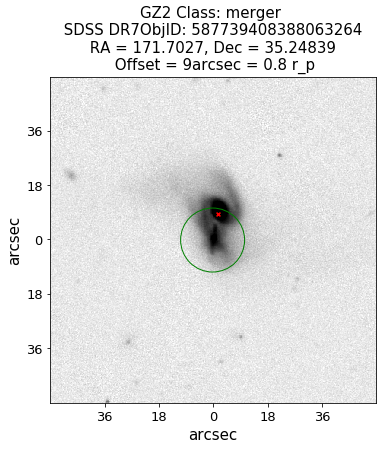

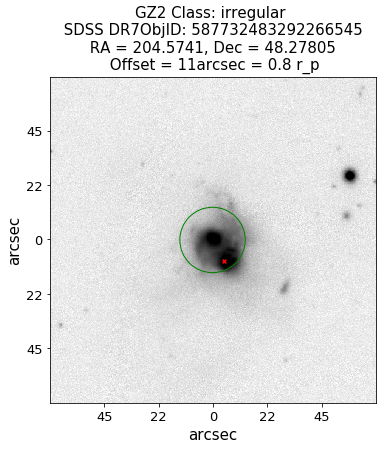

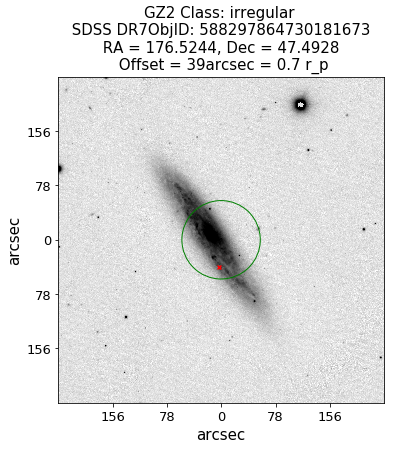

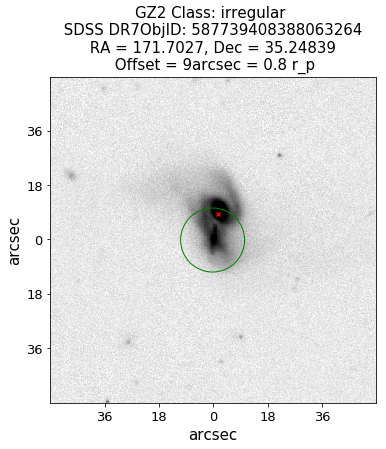

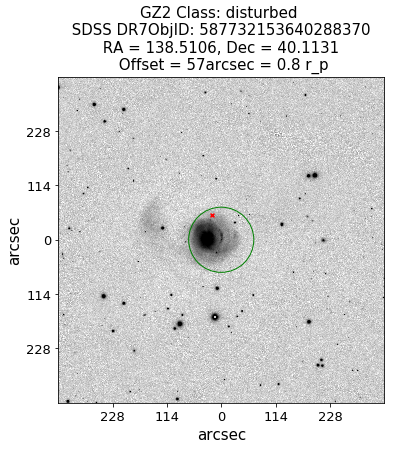

...

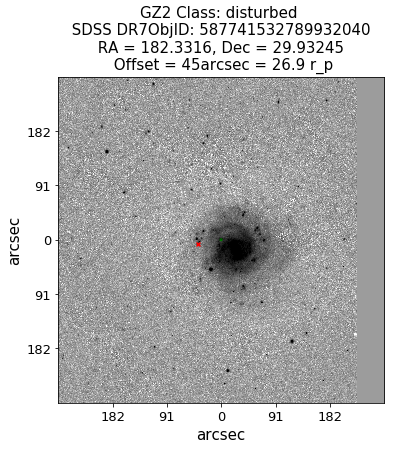

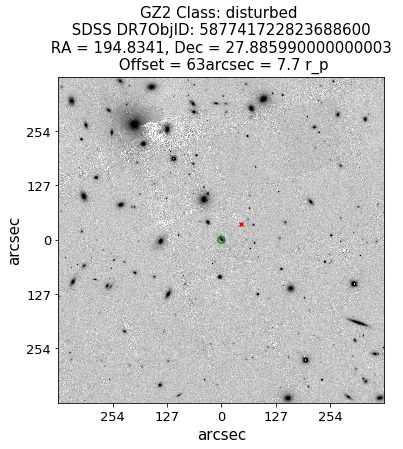

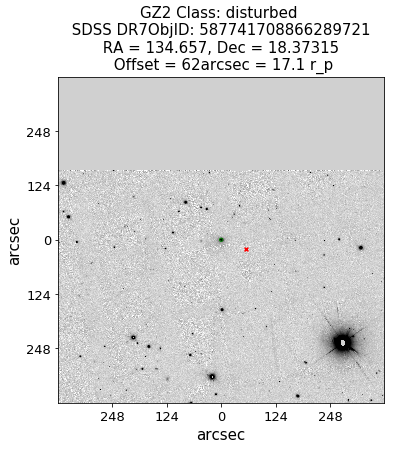

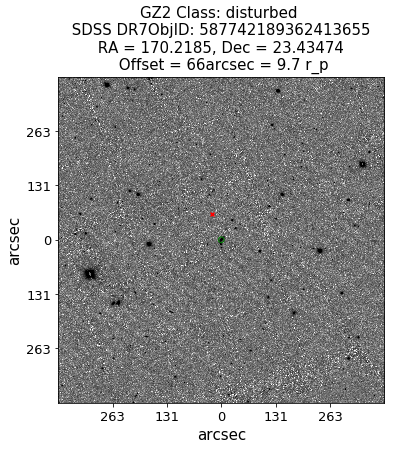

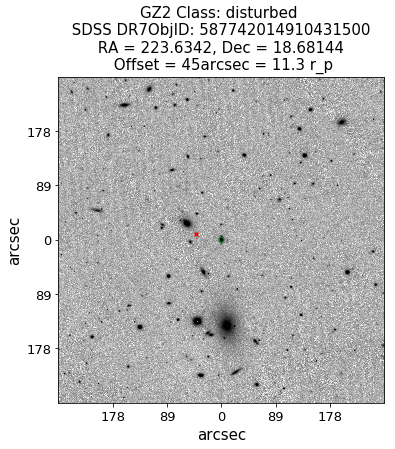

In [8]:
# Plotting PanSTARRS image with X-ray target and r_p circle, and saving image as a pdf file
PlotnSave(im_rp1, x_rp1, c_rp1, rpimg_rp1, rp1['DR7ObjID'], rp1['2CXO_ID'], rp1['classif'],
          rp1['offset_arcsec'], rp1['offset_rp'], rp1['RA'], rp1['Dec'], num=1)
PlotnSave(im_rp2, x_rp2, c_rp2, rpimg_rp2, rp2['DR7ObjID'], rp2['2CXO_ID'], rp2['classif'],
          rp2['offset_arcsec'], rp2['offset_rp'], rp2['RA'], rp2['Dec'], num=2)
PlotnSave(im_rp3, x_rp3, c_rp3, rpimg_rp3, rp3['DR7ObjID'], rp3['2CXO_ID'], rp3['classif'],
          rp3['offset_arcsec'], rp3['offset_rp'], rp3['RA'], rp3['Dec'], num=3)
PlotnSave(im_rp4, x_rp4, c_rp4, rpimg_rp4, rp4['DR7ObjID'], rp4['2CXO_ID'], rp4['classif'],
          rp4['offset_arcsec'], rp4['offset_rp'], rp4['RA'], rp4['Dec'], num=4)
PlotnSave(im_rp5, x_rp5, c_rp5, rpimg_rp5, rp5['DR7ObjID'], rp5['2CXO_ID'], rp5['classif'],
          rp5['offset_arcsec'], rp5['offset_rp'], rp5['RA'], rp5['Dec'], num=5)
PlotnSave(im_rph, x_rph, c_rph, rpimg_rph, rph['DR7ObjID'], rph['2CXO_ID'], rph['classif'],
          rph['offset_arcsec'], rph['offset_rp'], rph['RA'], rph['Dec'], num='h')

In [9]:
# Saving each r_p grouping into a csv file
rp1.to_csv('rp1_total.csv', index=False)
rp2.to_csv('rp2_total.csv', index=False)
rp3.to_csv('rp3_total.csv', index=False)
rp4.to_csv('rp4_total.csv', index=False)
rp5.to_csv('rp5_total.csv', index=False)
rph.to_csv('rph_total.csv', index=False)